<a href="https://colab.research.google.com/github/202204417/25-2-DIP-202204417/blob/main/HW05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import os
imgpath = '/content/drive/MyDrive/DIP_image'
#os.listdir(imgpath)


## Basic Intensity Transforms

In [8]:
f = plt.imread(os.path.join(imgpath,'breastxray.tif'))
print(f.shape,f.dtype)

(800, 650, 3) uint8


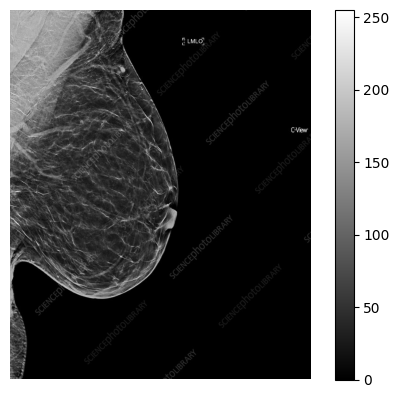

In [9]:
plt.imshow(f, cmap = 'gray')
plt.axis('off')
plt.colorbar()
plt.show()

- Image negatives

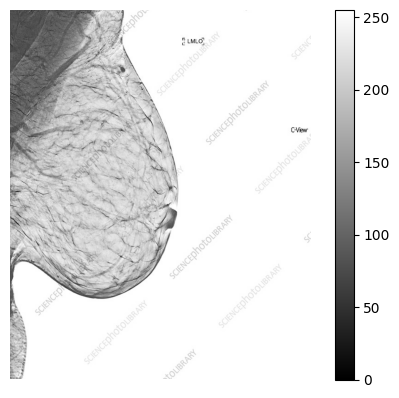

In [ ]:
f_inv = np.max(f) - f
plt.imshow(f_inv, cmap = 'gray')
plt.axis('off')
plt.colorbar()
plt.show()

- log transforms

/tmp/ipython-input-2288802716.py:12: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(F)), cmap = 'gray')


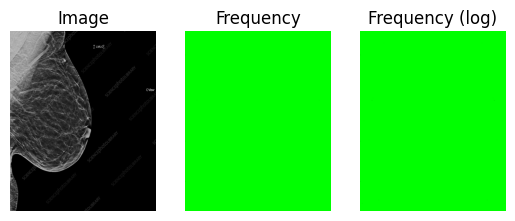

In [ ]:

F = np.fft.fftshift(np.fft.fft2(f))
plt.subplot(131)
plt.imshow(f, cmap = 'gray')
plt.axis('off')
#plt.colorbar()
plt.title('Image')
plt.subplot(132)
plt.imshow(np.abs(F), cmap = 'gray')
plt.axis('off')
plt.title('Frequency')
plt.subplot(133)
plt.imshow(np.log(np.abs(F)), cmap = 'gray')
plt.axis('off')
plt.title('Frequency (log)')
#plt.colorbar()
plt.show()

- Fourier domain processing

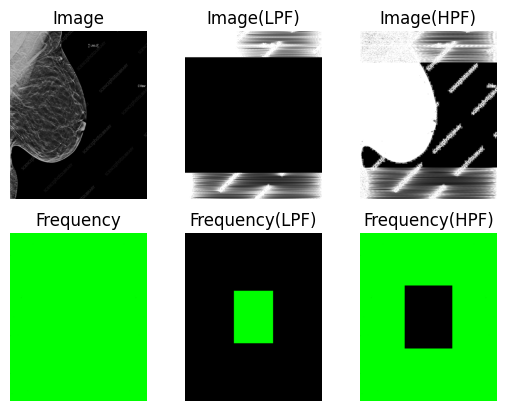

In [ ]:
F_mask_lpf = np.zeros_like(F)
F_mask_lpf[275:-275,232:-232] = 1
F_lpf = F_mask_lpf*F
f_lpf = np.fft.ifft2(np.fft.fftshift(F_lpf))
F_mask_hpf = np.ones_like(F)
F_mask_hpf[250:-250,212:-212] = 0
F_hpf = F_mask_hpf*F
f_hpf = np.fft.ifft2(np.fft.fftshift(F_hpf))

plt.subplot(231)
plt.imshow(f, cmap = 'gray')
plt.axis('off')
plt.title('Image')
plt.subplot(234)
plt.imshow(np.log(np.abs(F)+.001), cmap = 'gray')
plt.axis('off')
plt.title('Frequency')
plt.subplot(232)
plt.imshow(np.abs(f_lpf), cmap = 'gray')
plt.axis('off')
plt.title('Image(LPF)')
plt.subplot(235)
plt.imshow(np.log(np.abs(F_lpf)+.001), cmap = 'gray')
plt.axis('off')
plt.title('Frequency(LPF)')
plt.subplot(233)
plt.imshow(np.abs(f_hpf), cmap = 'gray',vmin=0,vmax=16)
plt.axis('off')
plt.title('Image(HPF)')
plt.subplot(236)
plt.imshow(np.log(np.abs(F_hpf)+.001), cmap = 'gray')
plt.axis('off')
plt.title('Frequency(HPF)')
plt.show()

- gamma correction

In [ ]:
f = plt.imread(os.path.join(imgpath,'spine.tif'))
print(f.shape,f.dtype)

(398, 381, 4) float32


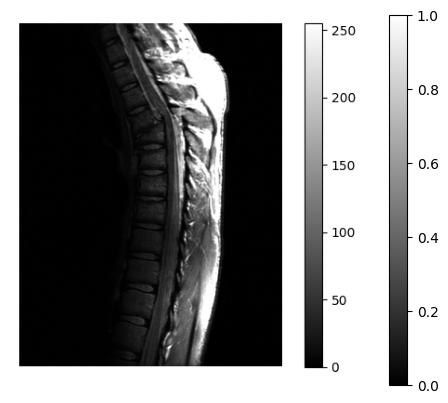

In [ ]:
plt.imshow(f, cmap = 'gray')
plt.axis('off')
plt.colorbar()
plt.show()

### Exercise 1
- 아래의 예는 gamma값을 잘못 설정하여 보정을 한 것 같다. 적절한 gamma를 찾아서 영상을 개선시켜보자.

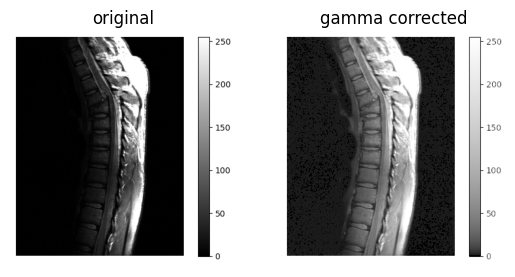

In [ ]:
gamma = 0.4
f_gc = np.power(f,gamma)
c = np.max(f)/np.max(f_gc)
f_gc = c * f_gc
plt.subplot(121)
plt.title('original')
plt.axis('off')
plt.imshow(f,cmap='gray')
plt.subplot(122)
plt.imshow(f_gc,cmap='gray')
plt.title('gamma corrected')
plt.axis('off')
plt.show()

## Histogram Processing

In [ ]:
f = plt.imread(imgpath+'/pollen-lowcontrast.tif')
print(f.shape,f.dtype)

(398, 468, 4) float32


- histogram equalization

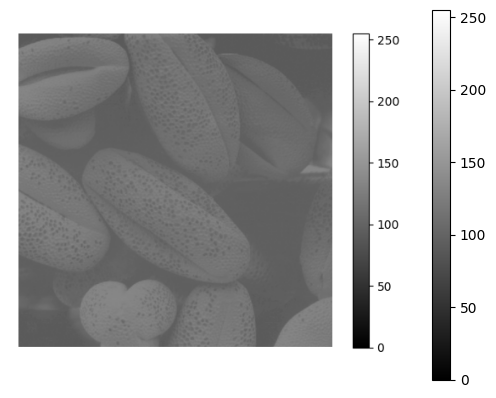

In [ ]:
plt.imshow(f, cmap = 'gray', vmin=0, vmax=255)
plt.axis('off')
plt.colorbar()
plt.show()

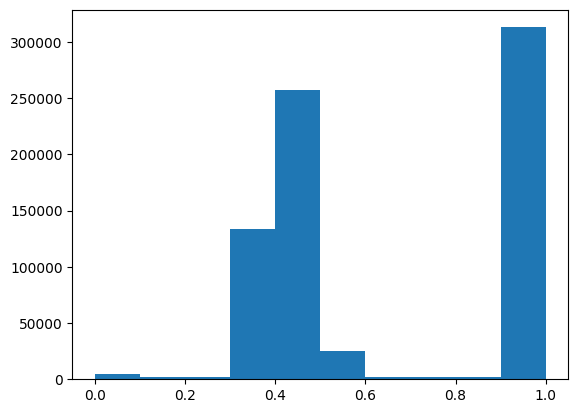

In [ ]:
plt.hist(f.flatten())
plt.show()

In [ ]:
def histogram_equalization(image):
    histogram, bins = np.histogram(image.flatten(), bins=256, range=[0,256])
    cdf = histogram.cumsum()
    cdf_min = cdf.min()
    cdf_max = cdf.max()
    cdf_normalized = (cdf - cdf_min) * 255 / (cdf_max - cdf_min)
    cdf_normalized = cdf_normalized.astype(np.uint8)
    equalized_image = cdf_normalized[image]
    return equalized_image

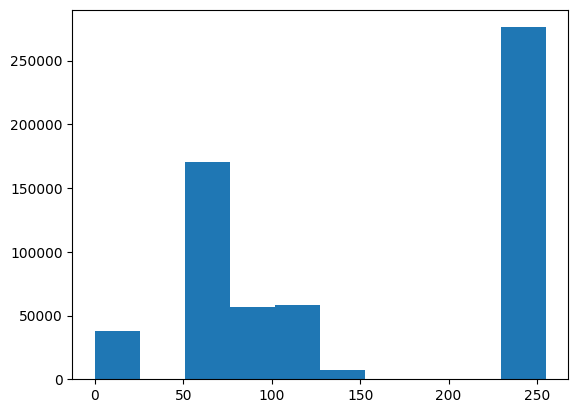

In [ ]:
f_eq = histogram_equalization((f * 255).astype(np.uint8))
plt.hist(f_eq.flatten())
plt.show()

- local histogram equalization

In [ ]:
f = plt.imread(imgpath+'/hidden-symbols.tif')
print(f.shape,f.dtype)

(389, 389, 4) float32


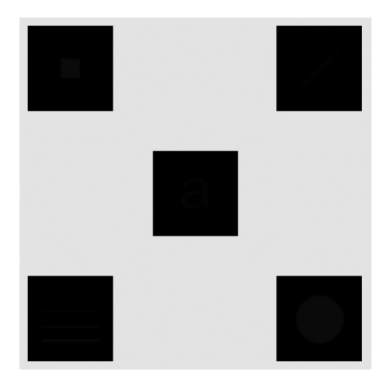

In [ ]:
plt.imshow(f,vmin=0,vmax=255,cmap='gray')
plt.axis('off')
plt.show()

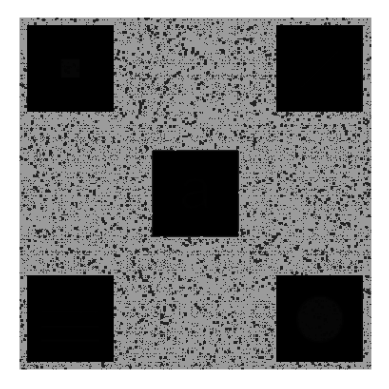

In [ ]:
f_eq = histogram_equalization((f * 255).astype(np.uint8))
plt.imshow(f_eq,vmin=0,vmax=255,cmap='gray')
plt.axis('off')
plt.show()

### Exercise 2.
- 아래의 예는 local histogram equalization을 수행한다.
- 적절한 neighborhood size N을 찾아서 숨겨진 기호들을 모두 확인해보자.
- plt.imshow의 vim, vmax를 수정하여서도 숨겨진 기호들을 확인할 수 있으나, 본 실습에서는 vmax=255로 고정하여 histogram processing을 통해 숨겨진 기호들을 확인하자.

/tmp/ipython-input-3935879381.py:6: RuntimeWarning: invalid value encountered in divide
  cdf_normalized = (cdf - cdf_min) * 255 / (cdf_max - cdf_min)
/tmp/ipython-input-3935879381.py:7: RuntimeWarning: invalid value encountered in cast
  cdf_normalized = cdf_normalized.astype(np.uint8)


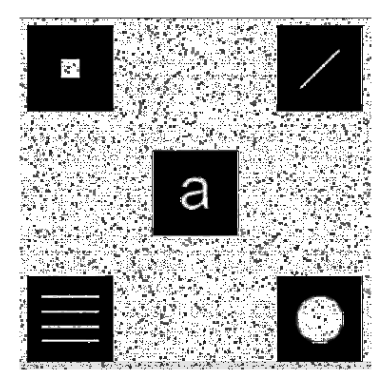

In [ ]:
N = 10
# Ensure f is treated as a color image if it has more than 2 dimensions, then convert to grayscale
if f.ndim == 3:
  f_gray = f[:, :, :3].mean(axis=2) # Convert to grayscale
elif f.ndim == 2:
  f_gray = f # Already grayscale
else:
  raise ValueError("Image must be 2D or 3D")

f_eq_local = np.zeros_like(f_gray)
sz0, sz1 = f_gray.shape
for x in np.arange(0, sz0, N):
  for y in np.arange(0, sz1, N):
    # Ensure the slice doesn't go out of bounds
    x_end = min(x + N, sz0)
    y_end = min(y + N, sz1)
    f_eq_local[x:x_end, y:y_end] = histogram_equalization((f_gray[x:x_end, y:y_end] * 255).astype(np.uint8))

plt.imshow(f_eq_local,vmin=0,vmax=255,cmap='gray')
plt.axis('off')
plt.show()

# Linear Spatial Filtering
## 2D convolution

In [ ]:
import scipy.signal as signal
from skimage import io

In [ ]:
f = io.imread('https://bme.hufs.ac.kr/CrossEditor/binary/images/000355/MT_4.jpeg',as_gray=True)[::2,::2]
print(f.shape,f.dtype)

(525, 700) float64


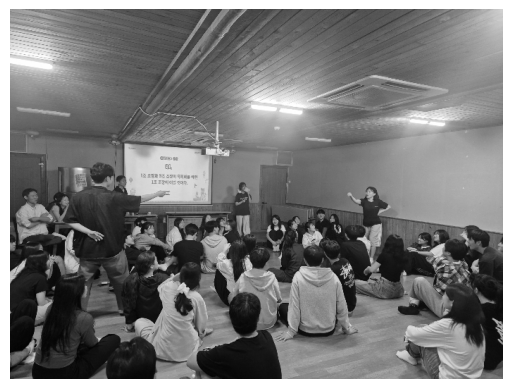

In [ ]:
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
w = np.random.randn(3,3)
#w = np.array([[1,-2,1],
#              [1,-2,1],
#              [1,-2,1]])
print(w)

[[ 1.00389667 -0.2169715  -0.16018942]
 [ 1.44428733 -0.5093668  -1.24807679]
 [ 0.72489906  2.82575952  0.02162816]]


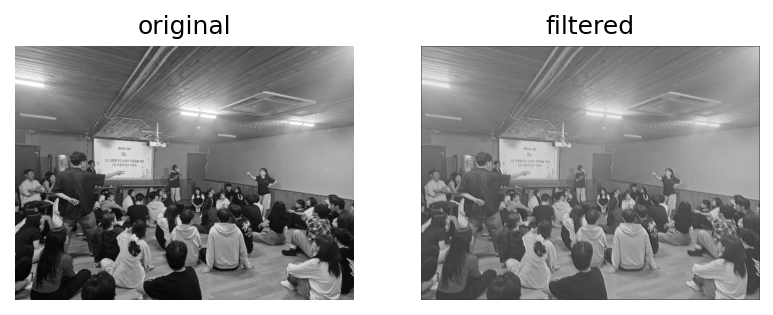

In [ ]:
sz0,sz1 = f.shape
y = np.zeros_like(f)
for i in np.arange(1,sz0-1):
  for j in np.arange(1,sz1-1):
    y[i,j] = np.sum(f[i-1:i+2,j-1:j+2]*w[::-1,::-1])

plt.figure(dpi=150)
plt.subplot(1,2,1)
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow(y,cmap='gray')
plt.axis('off')
plt.title('filtered')
plt.show()

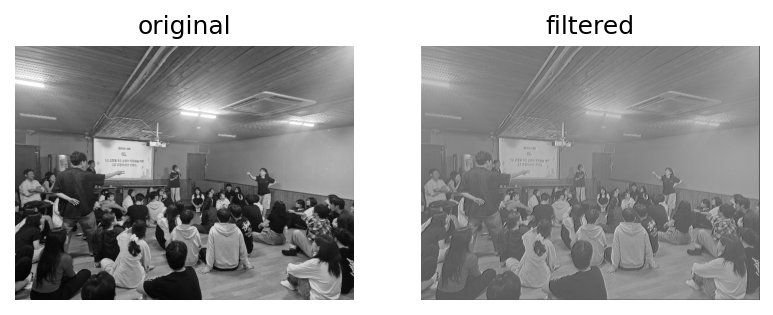

In [ ]:
y = signal.convolve2d(f,w,mode='same')
y.shape
plt.figure(dpi=150)
plt.subplot(121)
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.title('original')
plt.subplot(122)
plt.imshow(y,cmap='gray')
plt.axis('off')
plt.title('filtered')
plt.show()

## low pass filtering - box kernel

In [ ]:
w = np.ones((3,3))
w = w/np.sum(w)
print(w)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


In [ ]:
yb = signal.convolve2d(f,w,mode='same')


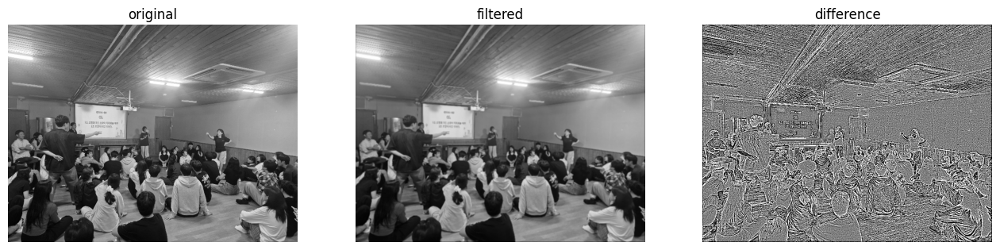

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.title('original')
plt.subplot(1,3,2)
plt.imshow(yb,cmap='gray')
plt.axis('off')
plt.title('filtered')
plt.subplot(1,3,3)
plt.imshow(yb-f,cmap='gray',vmin=-.01,vmax=.01)
plt.axis('off')
plt.title('difference')
plt.show()

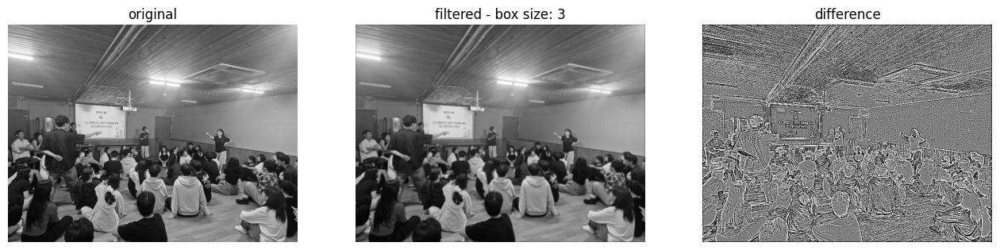

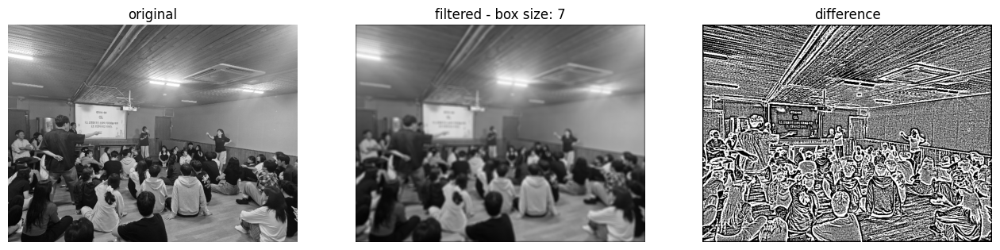

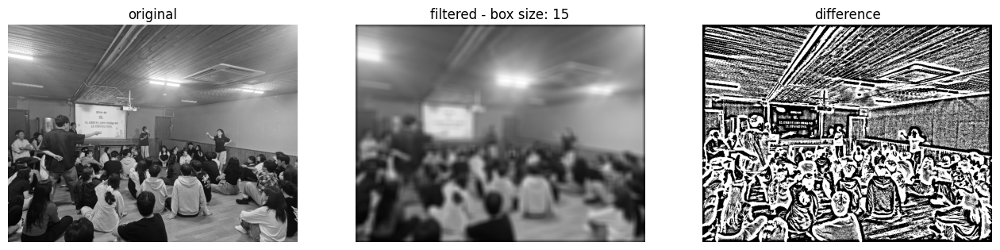

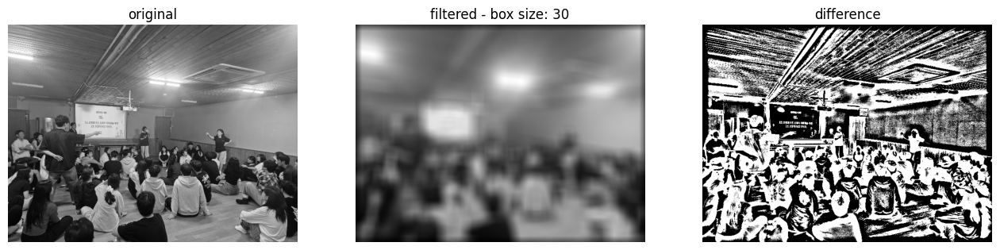

In [ ]:
for N in np.array([3,7,15,30]):
  wb = np.ones((N,N))
  wb = wb/np.sum(wb)
  y_b = signal.convolve2d(f,wb,mode='same')

  plt.figure(figsize=(16,9))
  plt.subplot(1,3,1)
  plt.imshow(f,cmap='gray')
  plt.axis('off')
  plt.title('original')
  plt.subplot(1,3,2)
  plt.imshow(y_b,cmap='gray')
  plt.axis('off')
  plt.title(f'filtered - box size: {N}')
  plt.subplot(1,3,3)
  plt.imshow(y_b-f,cmap='gray',vmin=-.01,vmax=.01)
  plt.axis('off')
  plt.title('difference')
  plt.show()

## lowpass filtering - Gaussian kernel

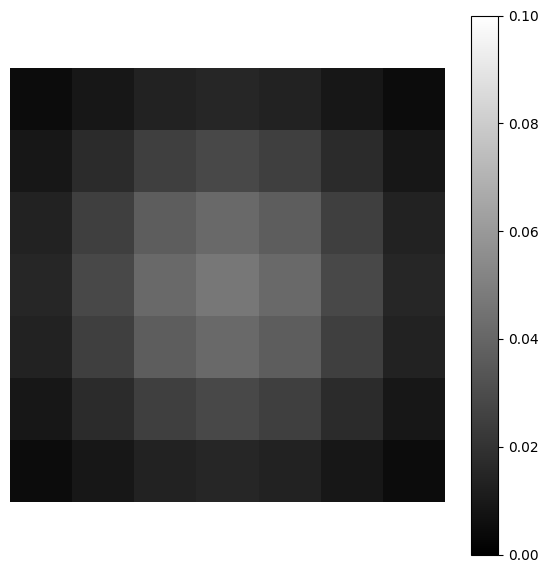

In [ ]:
N = 3
std = 2
s = np.arange(-N,N+1,1)
t = np.arange(-N,N+1,1)
S,T = np.meshgrid(s,t)
wg = np.exp(-(S**2+T**2)/(2*std*std))
wg = wg/np.sum(wg)

plt.figure(figsize=(7,7))
plt.imshow(wg,vmin=0,vmax=0.1,cmap='gray')
plt.axis('off')
plt.colorbar()
plt.show()

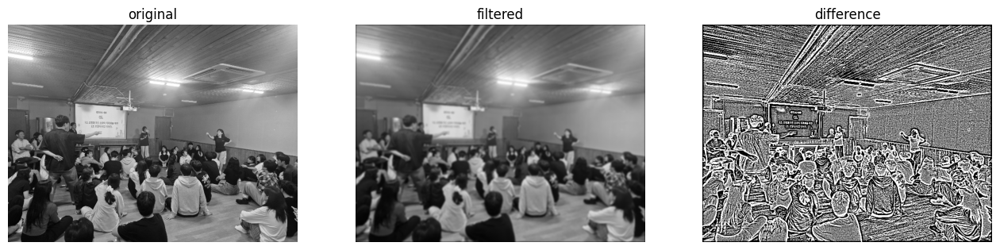

In [ ]:
y_g = signal.convolve2d(f,wg,mode='same')

plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.title('original')
plt.subplot(1,3,2)
plt.imshow(y_g,cmap='gray')
plt.axis('off')
plt.title('filtered')
plt.subplot(1,3,3)
plt.imshow(y_g-f,cmap='gray',vmin=-.01,vmax=.01)
plt.axis('off')
plt.title('difference')
plt.show()

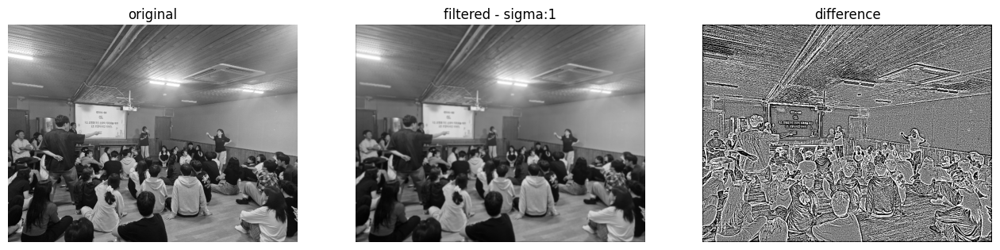

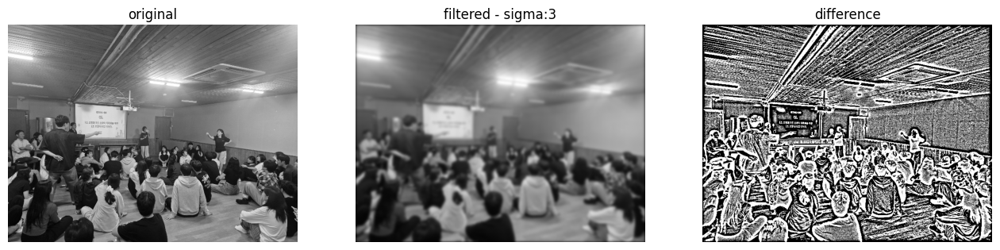

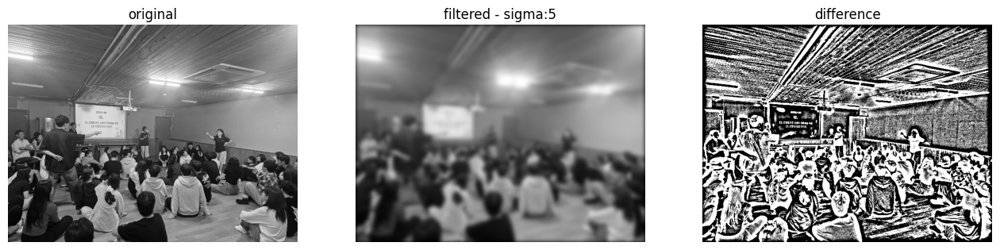

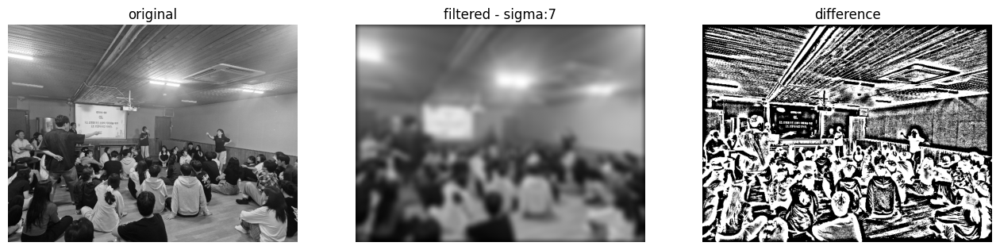

In [ ]:
s = np.arange(-13,14,1)
t = np.arange(-13,14,1)
S,T = np.meshgrid(s,t)

for std in np.array([1,3,5,7]):
  wg = np.exp(-(S**2+T**2)/(2*std*std))
  wg = wg/np.sum(wg)

  y_g = signal.convolve2d(f,wg,mode='same')

  plt.figure(figsize=(16,9))
  plt.subplot(1,3,1)
  plt.imshow(f,cmap='gray')
  plt.axis('off')
  plt.title('original')
  plt.subplot(1,3,2)
  plt.imshow(y_g,cmap='gray')
  plt.axis('off')
  plt.title(f'filtered - sigma:{std}')
  plt.subplot(1,3,3)
  plt.imshow(y_g-f,cmap='gray',vmin=-.01, vmax=.01)
  plt.axis('off')
  plt.title('difference')
  plt.show()

### Exercise 3.
- 직접 찍은 사진을 grayscale image로 불러와서, kernel size를 3x3, 7x7, 15x15, 30x30 으로 늘려가며 box kernel을 정의하여 LPF를 진행한 결과를 출력하고 kernel size에 따른 연산시간의 차이를 확인하자.

In [ ]:
f = io.imread('my image.jpg',as_gray=True)
print(f.shape,f.dtype)

(4284, 5712) float64


In [ ]:
import time

computation time =  0.7678070068359375  sec


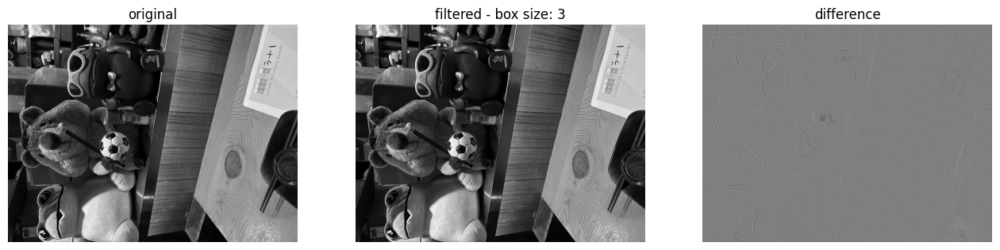

computation time =  2.3789353370666504  sec


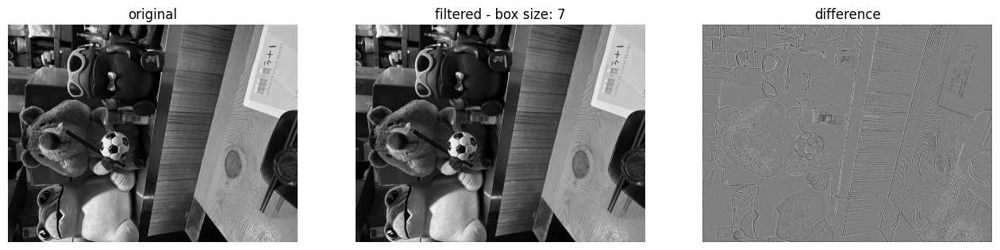

computation time =  10.001695394515991  sec


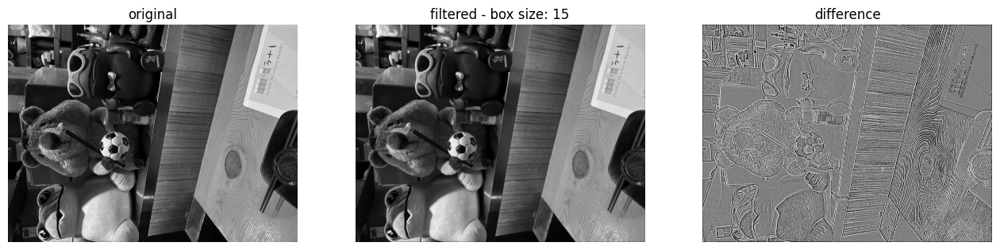

computation time =  33.1553008556366  sec


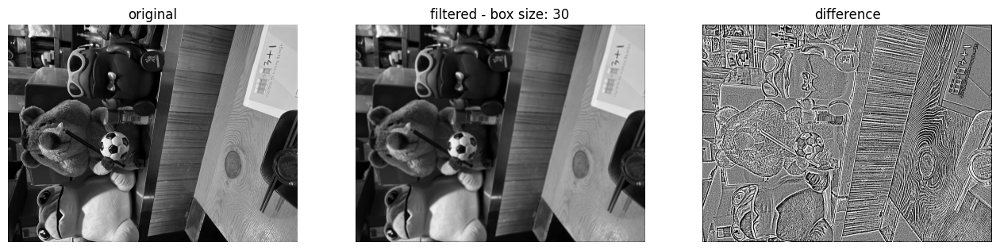

In [ ]:
for N in np.array([3,7,15,30]):
  wb = np.ones((N,N))
  wb = wb/np.sum(wb)
  s0 = time.time()
  y_b = signal.convolve2d(f,wb,mode='same')
  compu_time=time.time() - s0
  print('computation time = ', compu_time,' sec')
  plt.figure(figsize=(16,9))
  plt.subplot(1,3,1)
  plt.imshow(f,cmap='gray')
  plt.axis('off')
  plt.title('original')
  plt.subplot(1,3,2)
  plt.imshow(y_b,cmap='gray')
  plt.axis('off')
  plt.title(f'filtered - box size: {N}')
  plt.subplot(1,3,3)
  plt.imshow(y_b-f,cmap='gray',vmin=-.01,vmax=.01)
  plt.axis('off')
  plt.title('difference')
  plt.show()

# highpass filtering



(840, 1120, 3) uint8


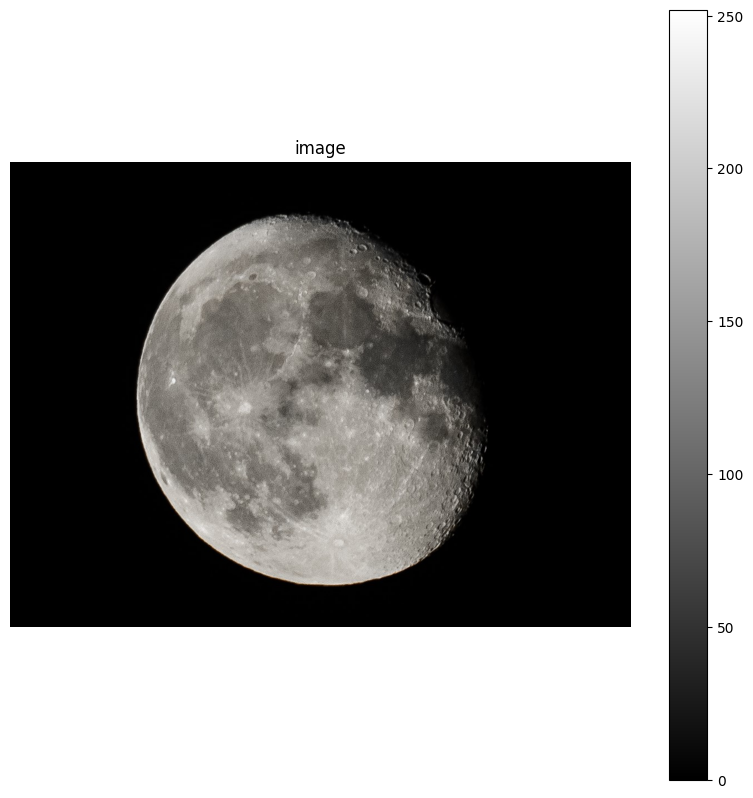

In [10]:
f = plt.imread(os.path.join(imgpath,'moon-blurred.tif'))
print(f.shape,f.dtype)
plt.figure(figsize=(10,10))
plt.imshow(f,cmap='gray')
plt.axis('off')
plt.title('image')
plt.colorbar()
plt.show()

# Laplacian Kernel (2nd order diff.)


In [11]:
w1 = np.array([[0,1,0],[1,-4.,1],[0,1,0]])
w2 = np.array([[0,-1,0],[-1,4.,-1],[0,-1,0]])

w3 = np.array([[1,1,1],[1,-8.,1],[1,1,1]])
w4 = np.array([[-1,-1,-1],[-1,8.,-1],[-1,-1,-1]])

print(w1)
print(w2)
print(w3)
print(w4)

[[ 0.  1.  0.]
 [ 1. -4.  1.]
 [ 0.  1.  0.]]
[[ 0. -1.  0.]
 [-1.  4. -1.]
 [ 0. -1.  0.]]
[[ 1.  1.  1.]
 [ 1. -8.  1.]
 [ 1.  1.  1.]]
[[-1. -1. -1.]
 [-1.  8. -1.]
 [-1. -1. -1.]]


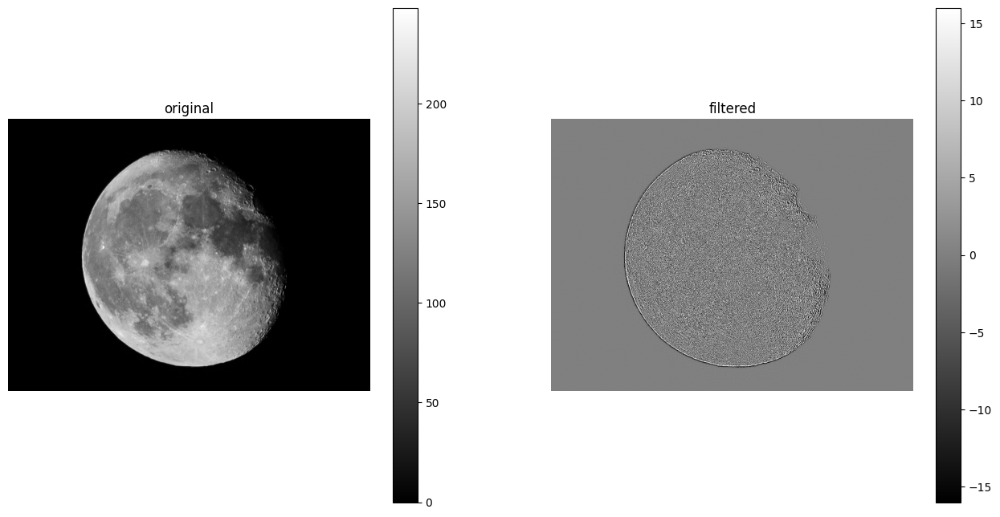

In [12]:
# Convert the color image to grayscale
f_gray = f[:, :, :3].mean(axis=2)

y = signal.convolve2d(f_gray,w2,mode='same')
y.shape
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(f_gray,cmap='gray') # Use the grayscale image for display
plt.colorbar()
plt.axis('off')
plt.title('original')
plt.subplot(122)
plt.imshow(y,cmap='gray',vmin=-16,vmax=16)
plt.colorbar()
plt.axis('off')
plt.title('filtered')
plt.show()

### Exercise 4.
- highpass filtering의 결과를 활용하여 blurred image를 sharp하게 개선시켜 보자.
- 자신만의 blurred image를 가져와서, Laplacian kernel을 통한 highpass filtering을 진행하고 이를 이용하여 원본영상의 sharpness를 증대시켜보자.
- w 및 c를 적절하게 변화시켜 가면서 결과를 확인하자.

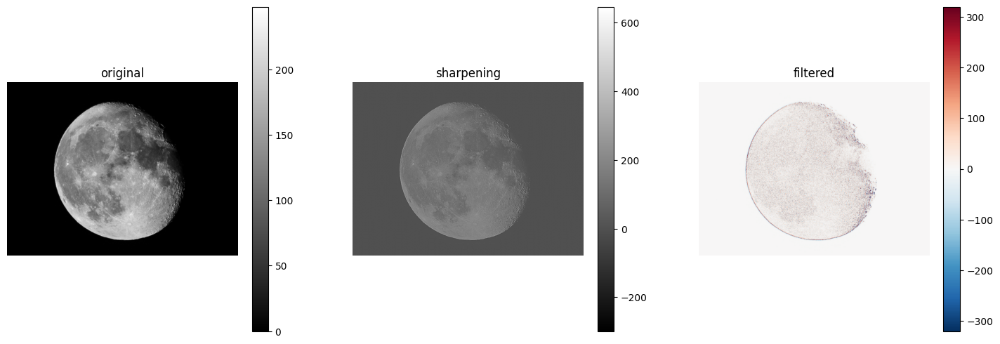

In [30]:
import matplotlib.pyplot as plt
import os
import numpy as np
import scipy.signal as signal

imgpath = '/content/drive/MyDrive/DIP_image'
f = plt.imread(os.path.join(imgpath,'moon-blurred.tif'))
# Convert to grayscale
f_gray = f[:, :, :3].mean(axis=2)

#f = io.imread('https://superresolution.co/wp-content/uploads/2024/08/superresolution-types-of-blurred-images-num5.webp',as_gray=True)[::2,::2]

w = np.array([[-1,-1,-1],[-1,8.,-1],[-1,-1,-1]])
y = signal.convolve2d(f_gray,w,mode='same')
c = 0.75
g = f_gray + c*(y)
plt.figure(figsize=(18,6))
plt.subplot(131)
plt.imshow(f_gray,cmap='gray')
plt.colorbar()
plt.axis('off')
plt.title('original')
plt.subplot(132)
plt.imshow(g,cmap='gray')
plt.colorbar()
plt.axis('off')
plt.title('sharpening')
plt.subplot(133)
plt.imshow(y,cmap='RdBu_r',vmin=-0.5*np.max(np.abs(y)),vmax=0.5*np.max(np.abs(y)))
plt.colorbar()
plt.axis('off')
plt.title('filtered')
plt.show()

## Sobel (1st order diff.)

In [18]:
sobel1 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
sobel2 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
print(sobel1)
print(sobel2)

[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]


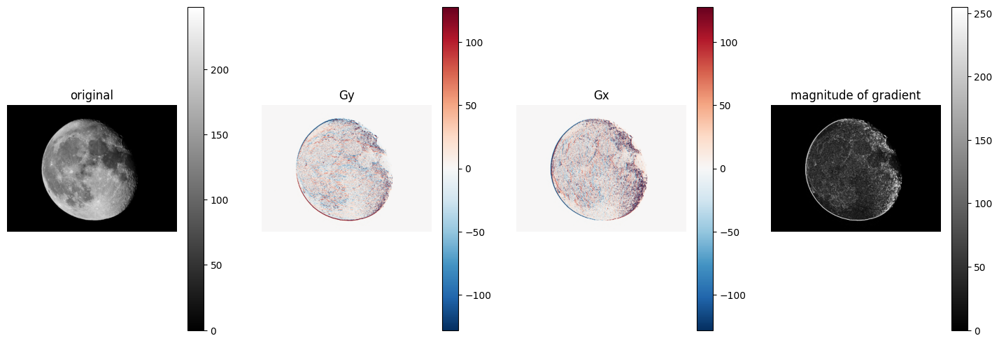

In [20]:
# Convert the color image to grayscale
f_gray = f[:, :, :3].mean(axis=2)

g1 = signal.convolve2d(f_gray,sobel1,mode='same')
g2 = signal.convolve2d(f_gray,sobel2,mode='same')
G = np.sqrt(g1**2+g2**2)

plt.figure(figsize=(18,6))
plt.subplot(141)
plt.imshow(f_gray,cmap='gray') # Use the grayscale image for display
plt.colorbar()
plt.axis('off')
plt.title('original')
plt.subplot(142)
plt.imshow(g1,cmap='RdBu_r',vmin=-128,vmax=128)
plt.colorbar()
plt.axis('off')
plt.title('Gy')
plt.subplot(143)
plt.imshow(g2,cmap='RdBu_r',vmin=-128,vmax=128)
plt.colorbar()
plt.axis('off')
plt.title('Gx')
plt.subplot(144)
plt.imshow(G,cmap='gray',vmin=0,vmax=255)
plt.colorbar()
plt.axis('off')
plt.title('magnitude of gradient')
plt.show()

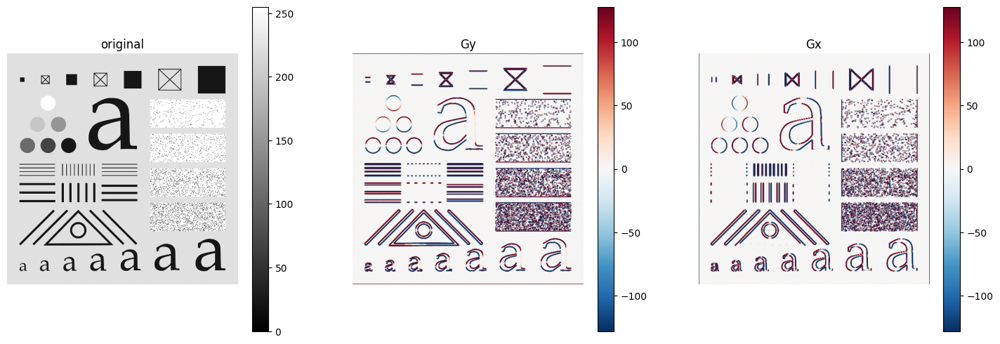

In [ ]:
f = plt.imread(os.path.join(imgpath,'testpattern512.tif'))

g1 = signal.convolve2d(f,sobel1,mode='same')
g2 = signal.convolve2d(f,sobel2,mode='same')
G = np.sqrt(g1**2+g2**2)

plt.figure(figsize=(18,6))
plt.subplot(131)
plt.imshow(f,cmap='gray')
plt.colorbar()
plt.axis('off')
plt.title('original')
plt.subplot(132)
plt.imshow(g1,cmap='RdBu_r',vmin=-128,vmax=128)
plt.colorbar()
plt.axis('off')
plt.title('Gy')
plt.subplot(133)
plt.imshow(g2,cmap='RdBu_r',vmin=-128,vmax=128)
plt.colorbar()
plt.axis('off')
plt.title('Gx')
plt.show()


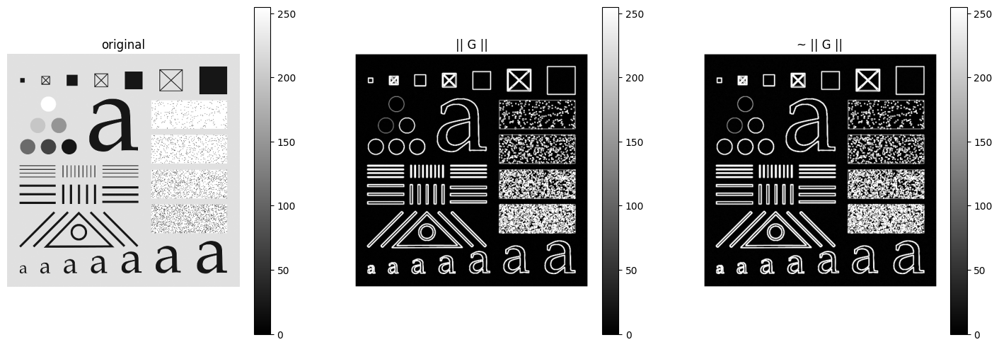

In [ ]:
G_ = np.abs(g1) + np.abs(g2)
plt.figure(figsize=(18,6))

plt.subplot(131)
plt.imshow(f,cmap='gray')
plt.colorbar()
plt.axis('off')
plt.title('original')

plt.subplot(132)
plt.imshow(G,cmap='gray',vmin=0,vmax=255)
plt.colorbar()
plt.axis('off')
plt.title('|| G ||')

plt.subplot(133)
plt.imshow(G_,cmap='gray',vmin=0,vmax=255)
plt.colorbar()
plt.axis('off')
plt.title('~ || G ||')

plt.show()
